In [1]:
import scanpy as sc

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


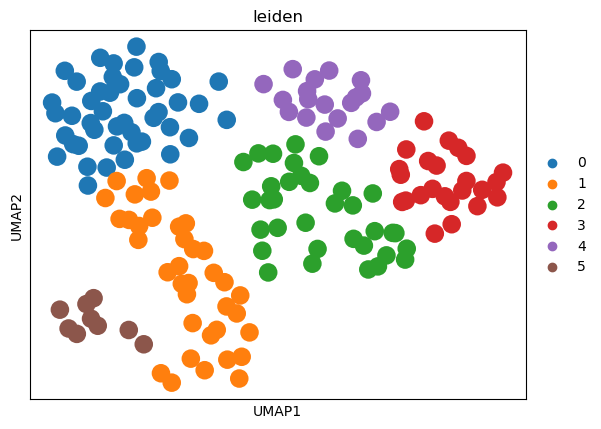

In [2]:
import scanpy as sc
import numpy as np
MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue=sc.read_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue.h5ad")
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color='leiden')

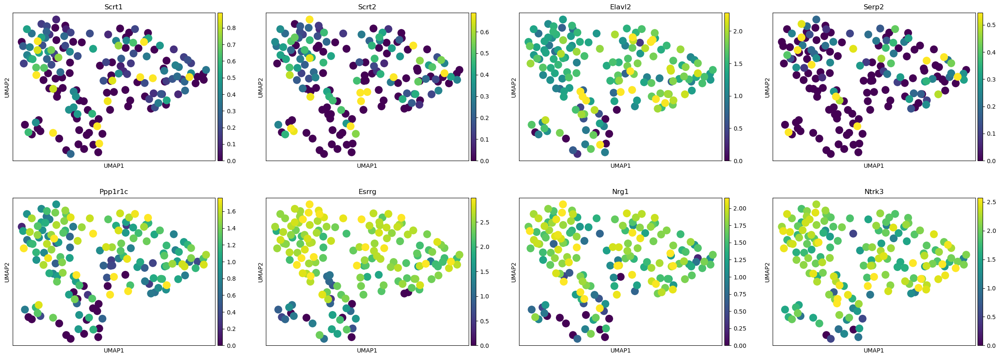

In [7]:
SGN_marker_genes=['Scrt1','Scrt2','Elavl2','Serp2','Ppp1r1c','Esrrg','Nrg1','Ntrk3']
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=SGN_marker_genes,vmax='p95',layer='log1p')

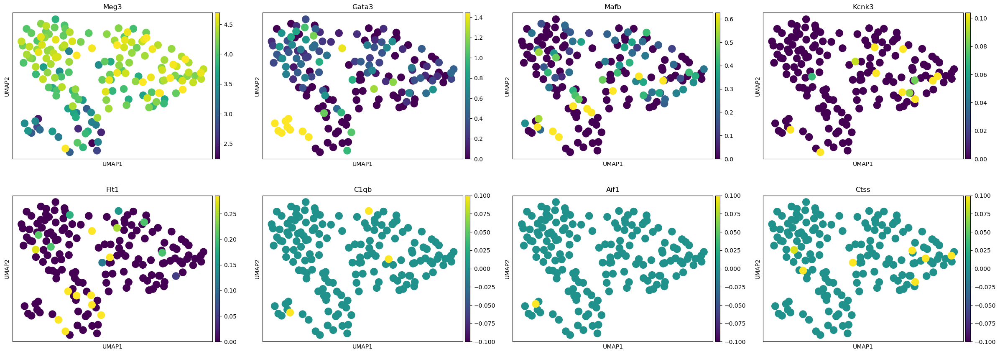

In [8]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Meg3','Gata3','Mafb','Kcnk3','Flt1','C1qb','Aif1','Ctss'],vmax='p95',layer='log1p')

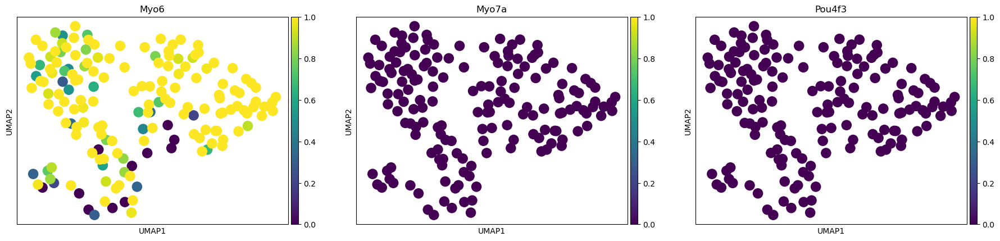

In [9]:
HC=['Myo6','Myo7a','Pou4f3']
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=HC,vmax=1,layer='log1p')

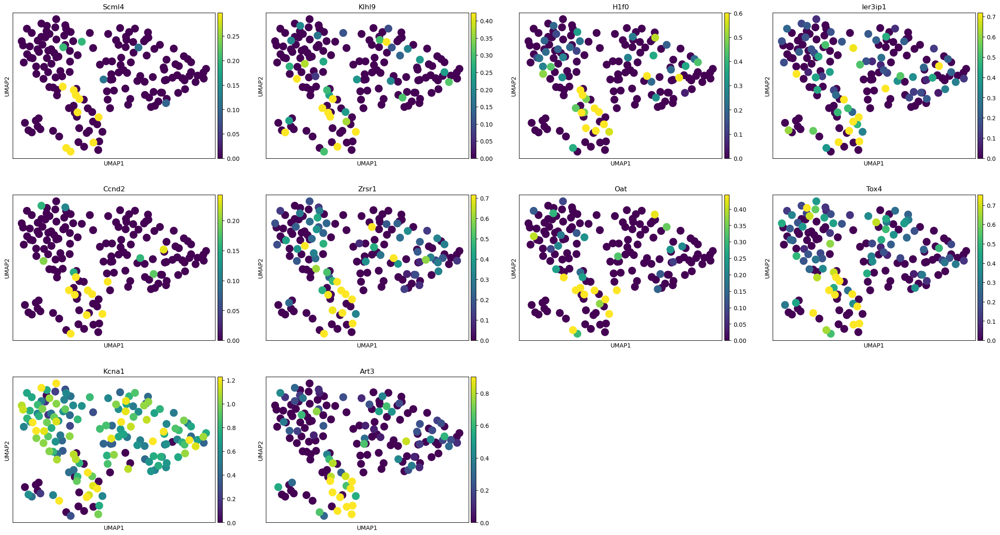

In [29]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Scml4','Klhl9','H1f0','Ier3ip1','Ccnd2','Zrsr1','Oat','Tox4','Kcna1','Art3'],vmax='p95',layer='log1p')

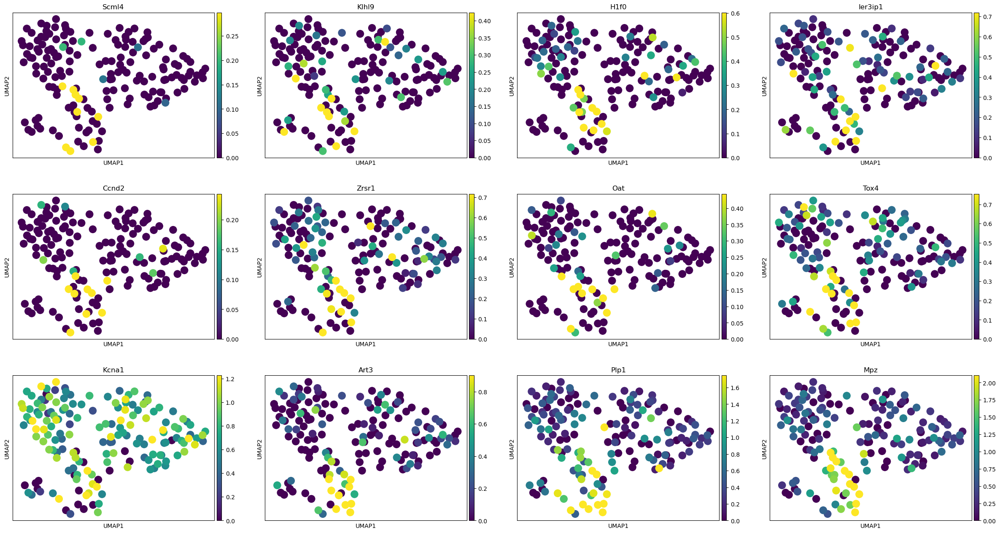

In [10]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Scml4','Klhl9','H1f0','Ier3ip1','Ccnd2','Zrsr1','Oat','Tox4','Kcna1','Art3','Plp1','Mpz'],vmax='p95',layer='log1p')

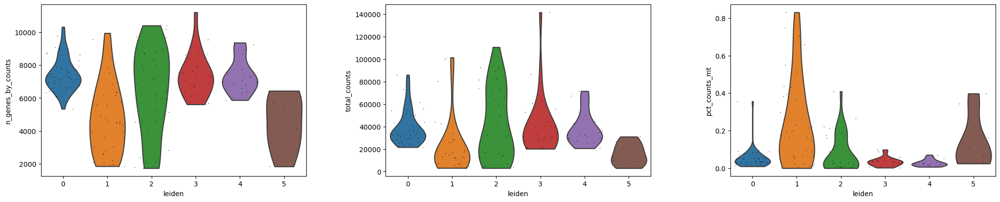

In [32]:
sc.pl.violin(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],groupby='leiden',
             jitter=0.4, multi_panel=True)

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


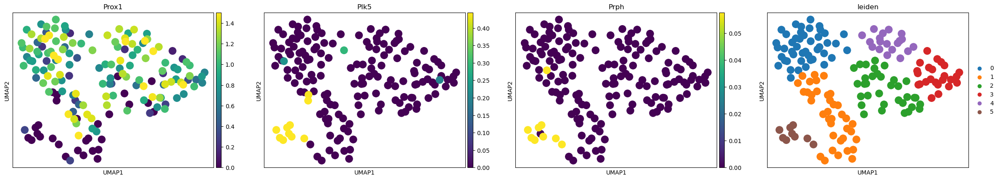

In [11]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Prox1','Plk5','Prph','leiden'],vmax='p95',layer='log1p')

In [12]:
sc.tl.leiden(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue, resolution=0.2 ,restrict_to=('leiden',['1']), key_added='leiden_sub')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


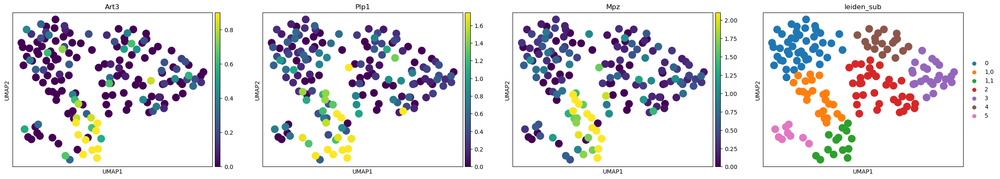

In [13]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Art3','Plp1','Mpz','leiden_sub'],vmax='p95',layer='log1p')

In [15]:
MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue.obsm['X_umapOriginal'] = MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue.obsm['X_umap'].copy()

In [16]:
MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue

AnnData object with n_obs × n_vars = 168 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex', 'leiden_sub'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap', 'leiden_sub_colors'
    obsm: 'X_pca', 'X_umap', 'X_umapOriginal'
    varm: 'PCs'
    layers: 'Scale', 'log1p', 'umi'
    obsp: 'connectivities', 'distances'

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


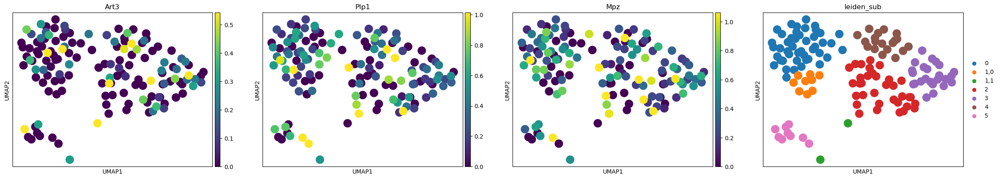

In [17]:
import numpy as np

ad = MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue

# 获取cluster1的细胞索引
cluster1_idx = ad.obs[ad.obs['leiden'] == '1'].index

# 获取相关基因的表达量
Mpz_values = ad[cluster1_idx, ad.var_names == 'Mpz'].layers['log1p'].flatten()
Plp1_values = ad[cluster1_idx, ad.var_names == 'Plp1'].layers['log1p'].flatten()

# 根据条件确定哪些细胞需要删除
delete_mask = (Mpz_values > 1.25) | (Plp1_values > 1)

# 获取需要删除的细胞索引
cells_to_delete = cluster1_idx[delete_mask]

# 确定哪些细胞保持不变
final_selected_cells = ad.obs.index.difference(cells_to_delete).tolist()

# 从AnnData对象中保留这些细胞
ad_filtered = ad[final_selected_cells, :]


sc.pl.umap(ad_filtered,color=['Art3','Plp1','Mpz','leiden_sub'],vmax='p95',layer='log1p')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


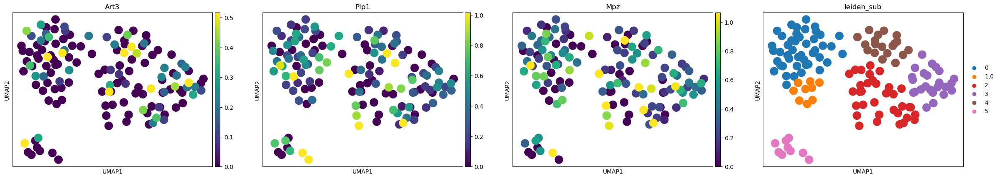

In [33]:
sc.pl.umap(ad_filtered,color=['Art3','Plp1','Mpz','leiden_sub'],vmax='p95',layer='log1p')

In [18]:
ad_filtered.obs['leiden_sub'].value_counts()

leiden_sub
0      45
2      34
3      24
4      19
1,0     9
5       9
1,1     2
Name: count, dtype: int64

In [34]:
ad_filtered

View of AnnData object with n_obs × n_vars = 140 × 33241
    obs: 'sample_ID_Plate', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'doublet_scores', 'predicted_doublets', 'sex', 'leiden_sub'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_ID_Plate_colors', 'umap', 'leiden_sub_colors'
    obsm: 'X_pca', 'X_umap', 'X_umapOriginal'
    varm: 'PCs'
    layers: 'Scale', 'log1p', 'umi'
    obsp: 'connectivities', 'distances'

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


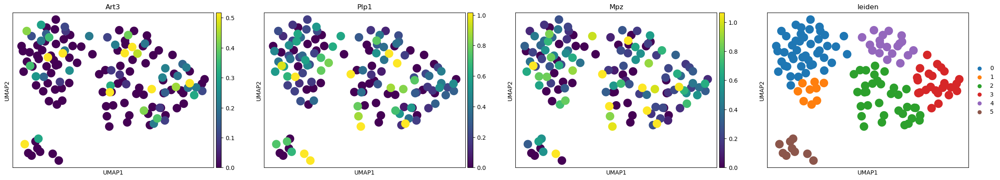

In [20]:
# 创建一个布尔掩码，其中标记为'1,1'的细胞为False，其余为True
mask = ad_filtered.obs['leiden_sub'] != '1,1'

# 使用该掩码来更新AnnData对象
ad_filtered = ad_filtered[mask]

sc.pl.umap(ad_filtered,color=['Art3','Plp1','Mpz','leiden'],vmax='p95',layer='log1p')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


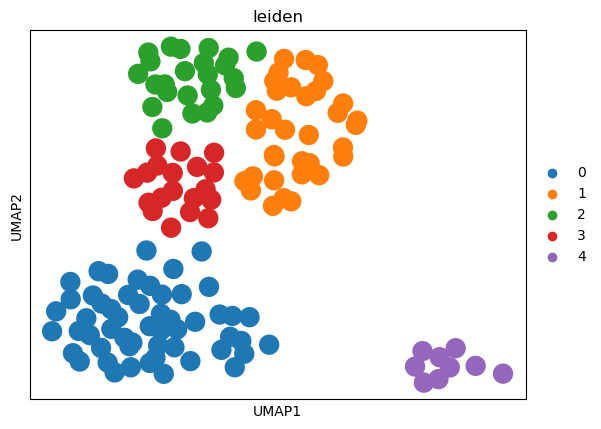

In [22]:
#ad_filtered2=ad_filtered.copy()
#sc.tl.leiden(ad_filtered2, resolution=0.7)
sc.tl.umap(ad_filtered2,min_dist=0.9)
sc.pl.umap(ad_filtered2,color='leiden')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


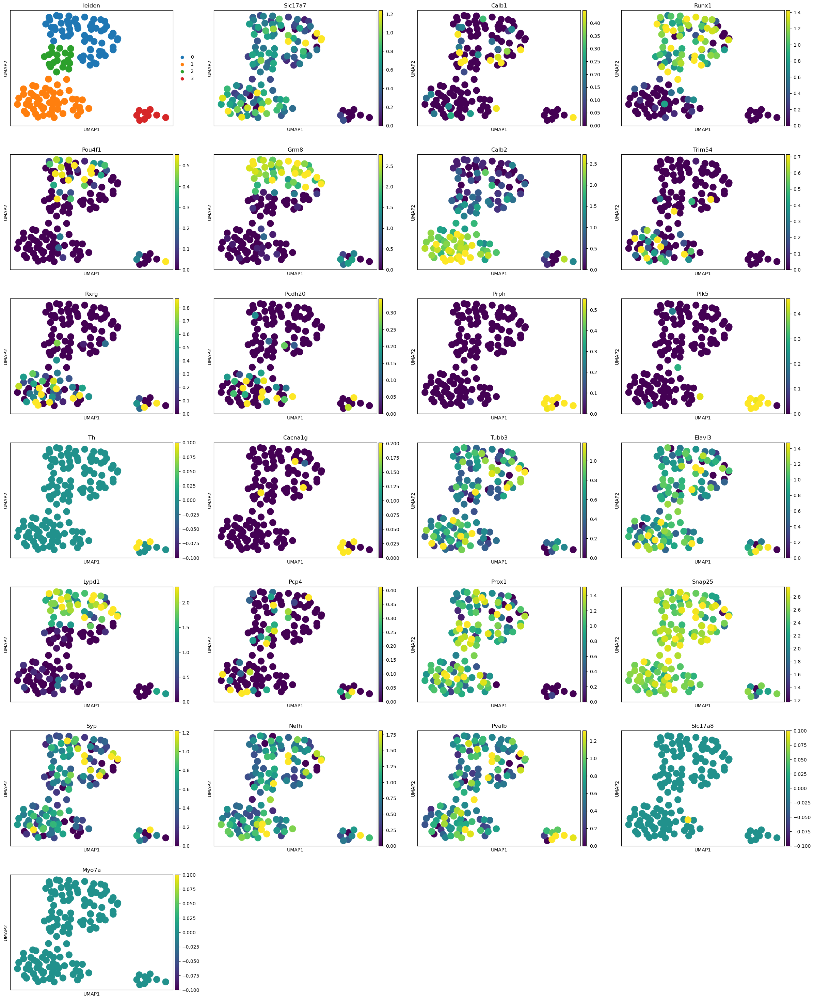

In [40]:
a=sc.pl.umap(ad_filtered3,color=neuron_cell_markers,vmax='p95',layer='log1p',show=False)
a[0].figure.savefig('/proj/sensoryaging/data/data/up_dated_data/SGNs/SGN_marker_genes.pdf', dpi=300)


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


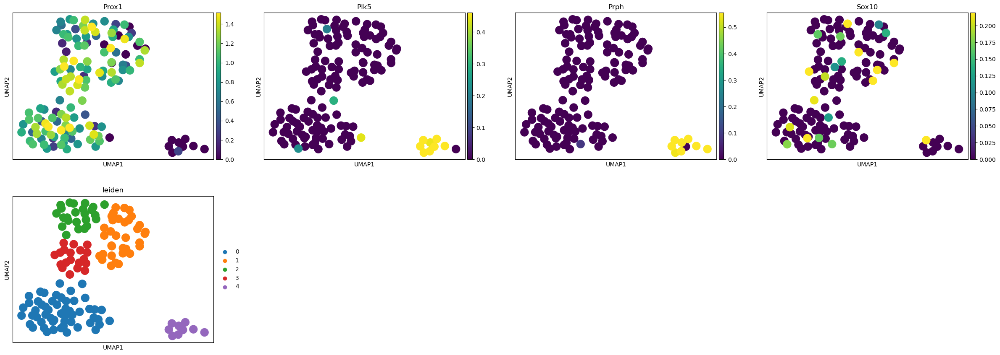

In [35]:
ad_filtered2
sc.pl.umap(ad_filtered2,color=['Prox1','Plk5','Prph','Sox10','leiden'],vmax='p95',layer='log1p')

In [36]:
ad_filtered3=ad_filtered2.copy()


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


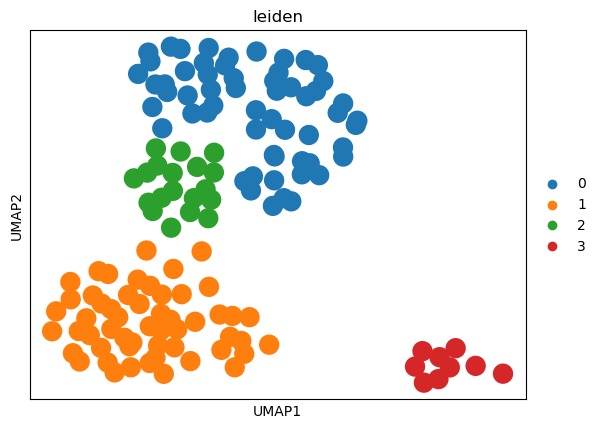

In [38]:
sc.tl.leiden(ad_filtered3, resolution=0.4)
sc.pl.umap(ad_filtered3,color='leiden')

[Executed on 2023-11-21 13:15:07.102937]


/proj/sensoryaging/.conda/env/Kelly/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/proj/sensoryaging/.conda/env/Kelly/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


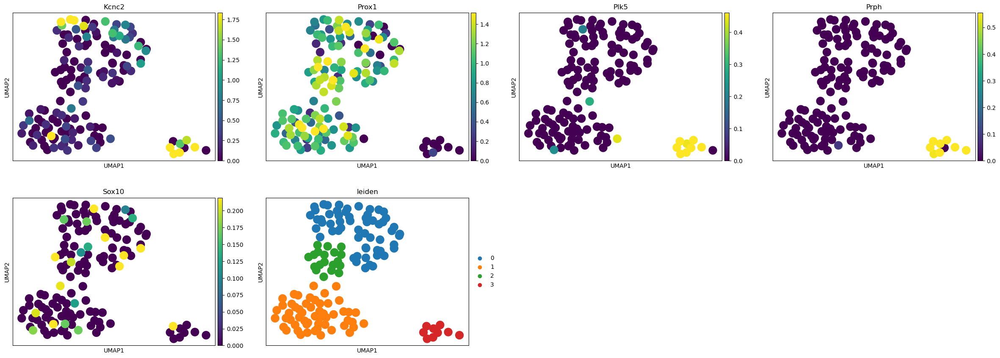

In [2]:
ad_filtered3
sc.pl.umap(ad_filtered3,color=['Kcnc2','Prox1','Plk5','Prph','Sox10','leiden'],vmax='p95',layer='log1p')

In [45]:
ad_filtered3.write_h5ad('/proj/sensoryaging/data/data/up_dated_data/SGNs/filter3butfinal.h5ad')

In [1]:
import scanpy as sc
ad_filtered3=sc.read_h5ad('/proj/sensoryaging/data/data/up_dated_data/SGNs/filter3butfinal.h5ad')

[Executed on 2023-11-21 13:13:32.695642]


In [47]:
cell_markers={
    'Type1A':['Calb2','B3gat1', 'Mdga1','Cd24a','Pcdh20','Paxbp1','Obscn','Maf','Elovl5','Zfp804a'],
    'Type1B':['Ttn','Calb1','Btbd9','Gm13205','Lgals1','Edil3','Eno1','Sema3e','Rasgrp2','Ccdc155'],
    'type IC':['Pou4f1'],
    'Type II':['Lypd1','Pou4f1','Cd164I2','Ntng1','Sphikap','Faim2','Pcsk2','Rph3a','Tagln3']
}


def umap(a):
    sc.pl.umap(cell_markers,color=a,vmax='p95',layer='log1p')

In [48]:
not_found_genes = []
from matplotlib.backends.backend_pdf import PdfPages


for cell_type, markers in cell_markers.items():
    print(f"UMAP for {cell_type}:")
    for marker in markers:

        try:
            umap(marker)


        except KeyError:
            print(f"Gene {marker} not found.")
            not_found_genes.append(marker)

# Print the genes that are not found
print(f"Genes not found: {not_found_genes}")

UMAP for Type1A:


AttributeError: 'dict' object has no attribute '_sanitize'

In [ ]:
sc.pl.umap(ad_filtered3,color=['Sox10'],vmax='1.4',vmin=0,layer='log1p')

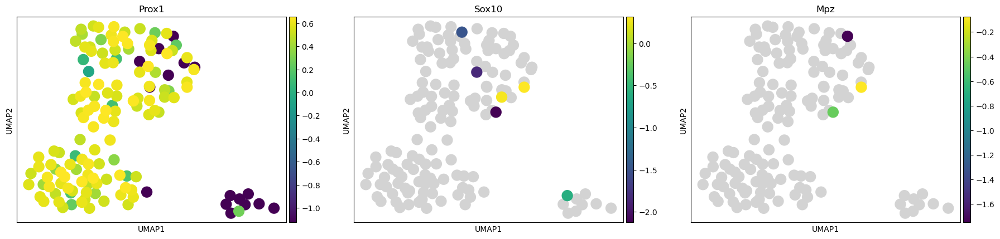

In [44]:
ad_filtered3
sc.pl.umap(ad_filtered3,color=['Prox1','Sox10','Mpz'],vmax='p95')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


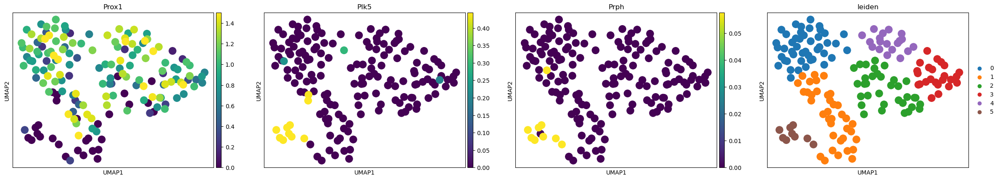

In [126]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Prox1','Plk5','Prph','leiden'],vmax='p95',layer='log1p')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


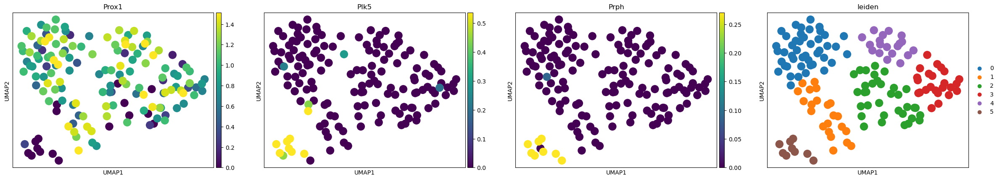

In [127]:
import numpy as np


ad=MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue
# 获取cluster1的细胞索引
cluster1_idx = ad.obs[ad.obs['leiden'] == '1'].index

# 获取相关基因的表达量
prox1_values = ad[cluster1_idx, ad.var_names == 'Prox1'].layers['log1p'].flatten()
plk5_values = ad[cluster1_idx, ad.var_names == 'Plk5'].layers['log1p'].flatten()
prph_values = ad[cluster1_idx, ad.var_names == 'Prph'].layers['log1p'].flatten()

# 根据条件筛选细胞
mask = (prox1_values > 0.4) | (plk5_values > 0.3) | (prph_values > 0.04)

# 获取满足条件的细胞索引
selected_cells_from_cluster1 = cluster1_idx[mask]

# 结合其他clusters的细胞
final_selected_cells = selected_cells_from_cluster1.tolist() + ad.obs[ad.obs['leiden'] != '1'].index.tolist()

# 更新AnnData对象
ad_filtered = ad[final_selected_cells, :]

sc.pl.umap(ad_filtered,color=['Prox1','Plk5','Prph','leiden'],vmax='p95',layer='log1p')


In [128]:
MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue.obs['leiden'].value_counts()

leiden
0    45
1    37
2    34
3    24
4    19
5     9
Name: count, dtype: int64

In [129]:
ad_filtered.obs['leiden'].value_counts()

leiden
0    45
2    34
3    24
1    22
4    19
5     9
Name: count, dtype: int64

In [6]:
sc.pl.umap(ad_filtered,color=['Prox1','Plk5','Prph','leiden'],vmax='p95',layer='log1p')

NameError: name 'ad_filtered' is not defined

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


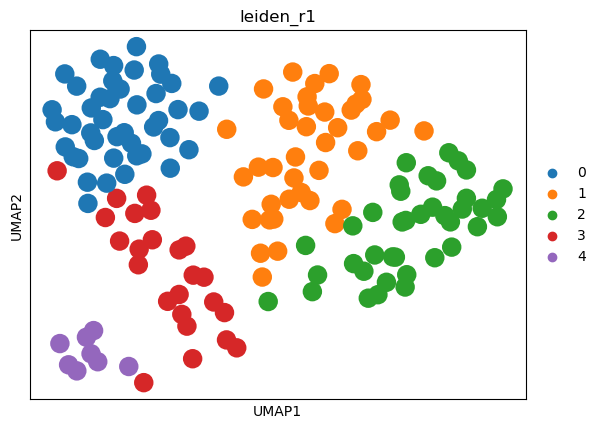

In [135]:
import scanpy as sc


# 如果您先前计算了邻居，那么可能不需要重新计算。但如果您筛选了很多细胞，那么最好重新计算。
sc.pp.neighbors(ad_filtered, n_neighbors=10, use_rep='X_pca')  # 使用X_pca或您之前使用的任何表示

# 使用相同的参数进行Louvain聚类，例如相同的分辨率
sc.tl.leiden(ad_filtered, resolution=0.8, key_added="leiden_r1")

# 根据需要绘制结果
sc.pl.umap(ad_filtered, color=["leiden_r1"])


In [89]:
ad_filtered.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/ad_filtered.h5ad")

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


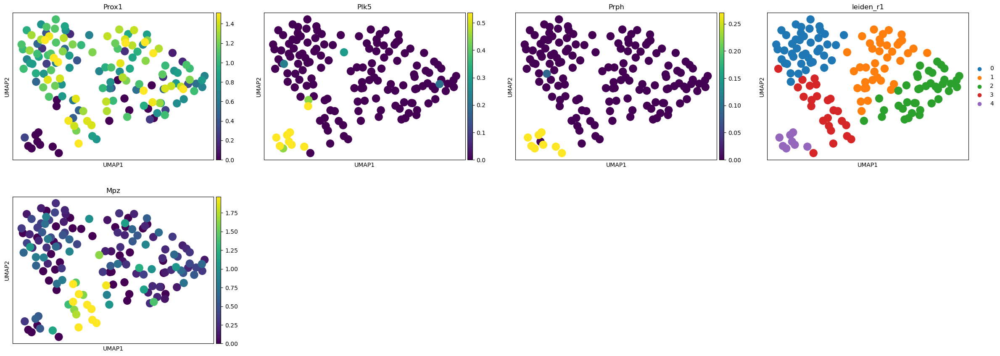

In [138]:
sc.pl.umap(ad_filtered,color=['Prox1','Plk5','Prph','leiden_r1','Mpz'],vmax='p95',layer='log1p')

In [ ]:
import numpy as np


ad_filtered2=ad_filtered
# 获取cluster1的细胞索引
cluster1_idx = ad_filtered2.obs[ad.obs['leiden'] == '1'].index

# 获取相关基因的表达量

plp1_values = ad[cluster1_idx, ad.var_names == 'Plp1'].layers['log1p'].flatten()
mpz_values = ad[cluster1_idx, ad.var_names == 'Mpz'].layers['log1p'].flatten()

# 根据条件筛选细胞
mask = (plp1_values > 0.8) | (mpz_values > 1.25)

# 获取满足条件的细胞索引
selected_cells_from_cluster1 = cluster1_idx[mask]

# 结合其他clusters的细胞
final_selected_cells = selected_cells_from_cluster1.tolist() + ad_filtered2.obs[ad_filtered2.obs['leiden'] != '1'].index.tolist()

# 更新AnnData对象
ad_filtered2 = ad_filtered2[final_selected_cells, :]

sc.pl.umap(ad_filtered2,color=['Art3','Plp1','Mpz','leiden'],vmax='p95',layer='log1p')


/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


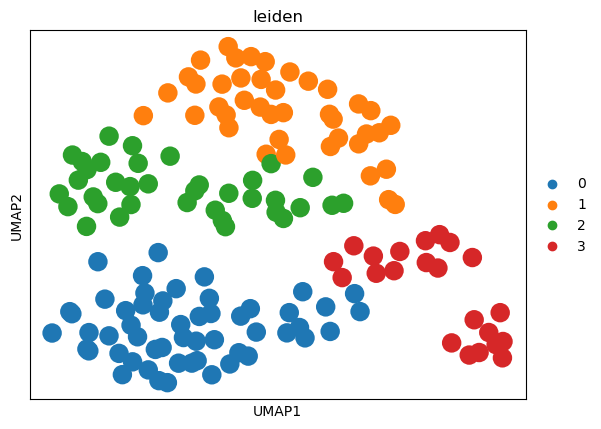

In [92]:
sc.tl.leiden(ad_filtered, resolution=0.4)
sc.tl.umap(ad_filtered,min_dist=0.7)
sc.pl.umap(ad_filtered,color=['leiden'])

In [ ]:
import scanpy as sc

In [ ]:
sc.pl.umap(MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue,color=['Prox1','Plk5','Prph','leiden'],vmax='p95',layer='log1p')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


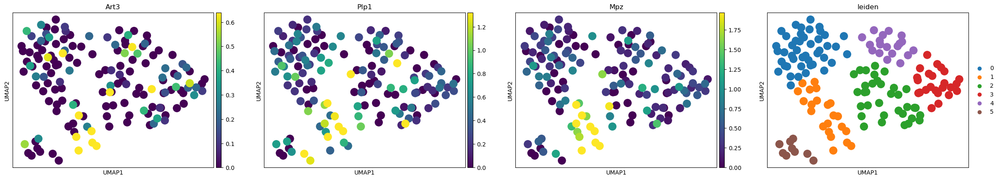

In [139]:
sc.pl.umap(ad_filtered,color=['Art3','Plp1','Mpz','leiden'],vmax='p95',layer='log1p')

/scratch/ipykernel_30837/423269449.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  cluster1_idx = ad_filtered2.obs[ad.obs['leiden'] == '1'].index
/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


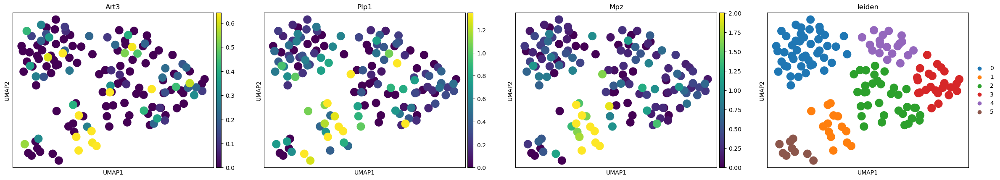

In [63]:
import numpy as np


ad_filtered2=ad_filtered
# 获取cluster1的细胞索引
cluster1_idx = ad_filtered2.obs[ad.obs['leiden'] == '1'].index

# 获取相关基因的表达量

plp1_values = ad[cluster1_idx, ad.var_names == 'Plp1'].layers['log1p'].flatten()
mpz_values = ad[cluster1_idx, ad.var_names == 'Mpz'].layers['log1p'].flatten()

# 根据条件筛选细胞
mask = (plp1_values > 0.8) | (mpz_values > 1.25)

# 获取满足条件的细胞索引
selected_cells_from_cluster1 = cluster1_idx[mask]

# 结合其他clusters的细胞
final_selected_cells = selected_cells_from_cluster1.tolist() + ad_filtered2.obs[ad_filtered2.obs['leiden'] != '1'].index.tolist()

# 更新AnnData对象
ad_filtered2 = ad_filtered2[final_selected_cells, :]

sc.pl.umap(ad_filtered2,color=['Art3','Plp1','Mpz','leiden'],vmax='p95',layer='log1p')


In [65]:
ad_filtered2.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue_filtered.h5ad")
ad.write_h5ad("/proj/sensoryaging/data/data/up_dated_data/SGNs/MaybeNeruonnopcp4_filtered_noPCP4_no_pink_no_blue.h5ad")

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


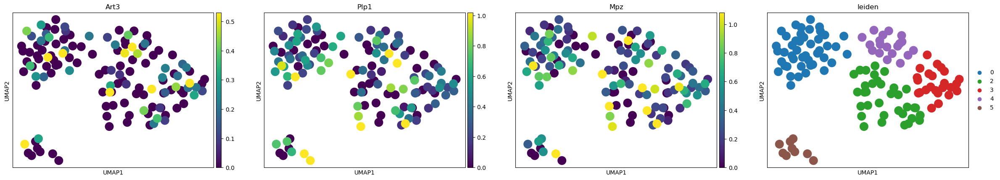

In [66]:
# 去除cluster 1
ad_filtered3=ad_filtered2[ad_filtered2.obs['leiden']!='1',:]

sc.pl.umap(ad_filtered3,color=['Art3','Plp1','Mpz','leiden'],vmax='p95',layer='log1p')


In [26]:
#From article Neuronal heterogeneity and stereotyped connectivity in the auditory afferent system 
neuron_cell_markers=['leiden','Slc17a7','Calb1','Runx1','Pou4f1','Grm8','Calb2','Trim54','Rxrg','Pcdh20','Prph','Plk5','Th','Cacna1g','Tubb3','Elavl3','Lypd1','Pcp4','Prox1','Snap25','Syp','Nefh','Pvalb','Slc17a8','Myo7a']

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


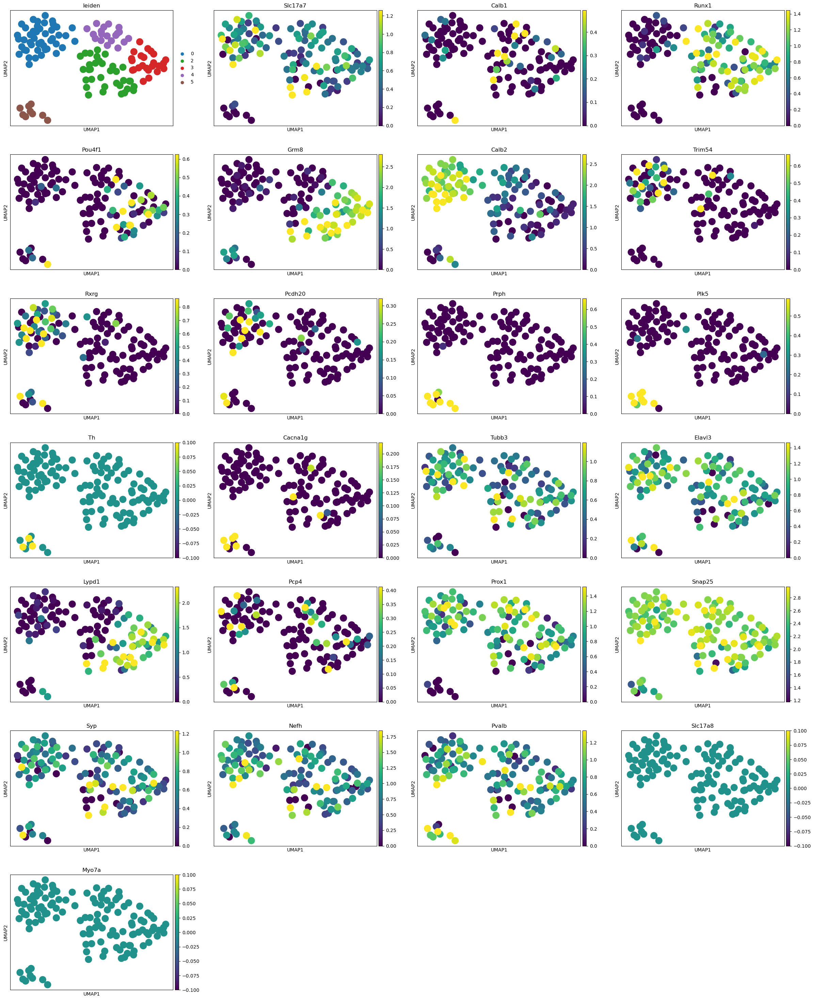

In [87]:
sc.pl.umap(ad_filtered3,color=neuron_cell_markers,layer='log1p',vmax='p95',save='828Neuron.pdf')

/proj/sensoryaging/.conda/env/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


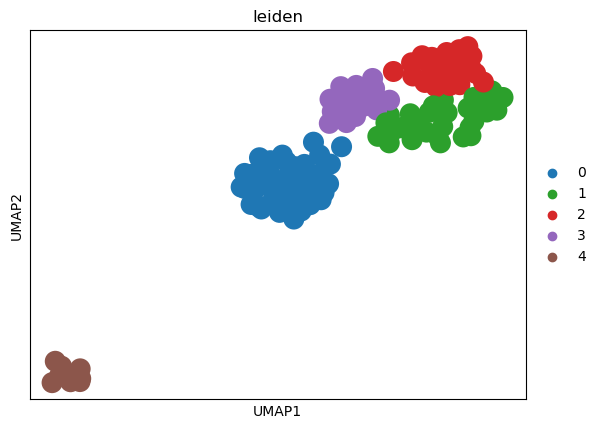

In [88]:
ad_filtered4=ad_filtered3.copy()
sc.tl.leiden(ad_filtered4, resolution=0.8)
sc.tl.umap(ad_filtered4,min_dist=0.7)
sc.pl.umap(ad_filtered4,color=['leiden'])